# Vizualization of the behaviour of the magnetics diagnostics

The goals of this notebook is to better understand the structure of the dataset for the MAST Plasma Equilibrium Challenge.

The dataset is composed of many diagnostic timeseries of the magnetics sensors.

In [412]:
# Standard library imports
import pathlib

# Third-party imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import xarray as xr

In [413]:
path = pathlib.Path().absolute().parent / "fair_mast_data/plasma_equilibrium"

try:
    with (
        xr.open_dataset(path / "train.nc") as train,
        xr.open_dataset(path / "test.nc") as test,
    ):
        train = train.load()
        test = test.load()

except FileNotFoundError:
    raise FileNotFoundError(
        "Please run the `Plasma Equilibrium Dataset.ipynb` notebook to download the "
        "required dataset from the FAIR-MAST server")


In [414]:
variables = list(train.data_vars)
print(len(variables))
for v in variables:
    print(v)


24
b_field_pol_probe_cc_field
b_field_pol_probe_ccbv_field
b_field_pol_probe_obr_field
b_field_pol_probe_obv_field
b_field_pol_probe_omv_voltage
b_field_tor_probe_saddle_field
b_field_tor_probe_saddle_voltage
flux_loop_flux
ip
density_gradient
filter_spectrometer_dalpha_voltage
horizontal_cam_lower
horizontal_cam_upper
n_e
n_e_core
p_e
t_e
t_e_core
shot_index
psi
b_field_tor_probe_cc_field
b_field_tor_probe_omaha_voltage
filter_spectrometer_bes_voltage
tangential_cam


In [415]:
print(train)

<xarray.Dataset> Size: 20MB
Dimensions:                                   (time: 533,
                                               b_field_pol_probe_cc_channel: 5,
                                               b_field_pol_probe_ccbv_channel: 40,
                                               b_field_pol_probe_obr_channel: 18,
                                               b_field_pol_probe_obv_channel: 18,
                                               b_field_pol_probe_omv_channel: 3,
                                               ...
                                               horizontal_cam_upper_channel: 18,
                                               major_radius: 65, z: 65,
                                               b_field_tor_probe_cc_channel: 3,
                                               b_field_tor_probe_omaha_channel: 4,
                                               bes_channel: 32,
                                               tangential_cam_channel: 18)


In [416]:
print(train.data_vars)

Data variables:
    b_field_pol_probe_cc_field          (time, b_field_pol_probe_cc_channel) float64 21kB ...
    b_field_pol_probe_ccbv_field        (time, b_field_pol_probe_ccbv_channel) float64 171kB ...
    b_field_pol_probe_obr_field         (time, b_field_pol_probe_obr_channel) float64 77kB ...
    b_field_pol_probe_obv_field         (time, b_field_pol_probe_obv_channel) float64 77kB ...
    b_field_pol_probe_omv_voltage       (time, b_field_pol_probe_omv_channel) float64 13kB ...
    b_field_tor_probe_saddle_field      (time, b_field_tor_probe_saddle_field_channel) float64 51kB ...
    b_field_tor_probe_saddle_voltage    (time, b_field_tor_probe_saddle_voltage_channel) float64 51kB ...
    flux_loop_flux                      (time, flux_loop_channel) float64 64kB ...
    ip                                  (time) float64 4kB -673.5 ... -2.718e+03
    density_gradient                    (time) float64 4kB nan nan ... 1.102e+18
    filter_spectrometer_dalpha_voltage  (time, dalpha

In [417]:
print(np.unique(train["shot_index"].values))

[0 1 2 3 4]


In [418]:
train.shot_index

<xarray.DataArray 'shot_index' (time: 533)> Size: 4kB
array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4])
Coordinates:
  * time     (time) float64 4kB -0.0656 -0.0606 -0.0556 ... 0.2888 0.2938 0.2988

### 1. Is the timestep constant ?

In [419]:
# Visualize the time and the timestep
def visualize_time(data: xr.Dataset) -> None:
    plt.figure(figsize=(10, 5))
    plt.plot(data["time"].values, label="Time")
    plt.plot(np.diff(data["time"].values), label="Timestep")
    plt.xlabel("Time index")
    plt.ylabel("Time values (multiple shots)")
    plt.title("Time Visualization")
    plt.legend()
    plt.show()

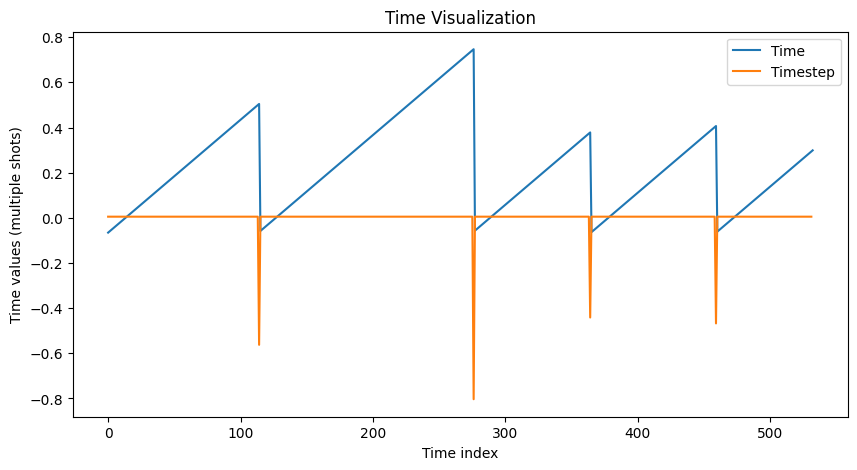

In [420]:
visualize_time(train)

### 2. Visualize all the available data variables

We build two function:
* the first one for 1D variable
* second one fore the 2D

For each variable, we can choose what we want:
* visu = "all" (all the shots in a row in one undated timeline) or "shots" (the shots are separated from the others and with real timeline).
* shot_index = None (all the shots are ploted) or the number of the shot we want to plot. Shot_index can be used only if we have selected visu = "shots".

In [421]:
# Visualize the 1D variable

def visualize_data_1D(data: xr.Dataset, variable_name: str, visu: str = "all", shot_index: int = None) -> None:
    """
    Visualizes a 1D variable from the dataset.
    
    Parameters:
    - data: xarray Dataset containing the variable.
    - variable_name: Name of the variable to visualize.
    - visu: Visualization type, can be "all" for all channels or "shots" for all shots in rows.
    - shot_index: Index of the shot to visualize.
    """
    # Shape
    print("Shape of the variable", data[variable_name].shape)

    # Nan value per channel
    print("Number of NaN values in the variable:", (data[variable_name].isnull().sum(axis=0).to_numpy()))

    # Plot
    
    if visu == "all":
        plt.figure(figsize=(10, 5))
        plt.plot(data[variable_name],
                 label=variable_name)
        plt.xlabel("Time")
        plt.ylabel(variable_name)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.grid()

    elif visu == "shots":
        n = len(pd.unique(train.shot_index.values))
        

        if shot_index is not None:
            index = data.shot_index.values == shot_index
            if not np.any(index):
                raise ValueError(f"Shot index {shot_index} not found in the dataset.")
            
            plt.figure(figsize=(10, 5))
            plt.plot(data[variable_name].time.to_numpy()[index], 
                 data[variable_name].to_numpy()[index],
                 label=variable_name)
            plt.xlabel("Time")
            plt.ylabel(variable_name)
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
            plt.grid()
            
        else:
        
            fig, axes = plt.subplots(nrows=n, figsize=(10, 5*n))
            for i, ax in enumerate(axes):
                idx = data.shot_index.values == i
                ax.plot(data[variable_name].time.to_numpy()[idx], 
                        data[variable_name].to_numpy()[idx],
                        label=variable_name)
                ax.set_title(f"Shot Index: {i}")
                ax.set_xlabel("Time")
                ax.set_ylabel(variable_name)
                ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
                ax.grid()

    else:
        raise ValueError("Invalid visualization type. Use 'all' or 'shots'.")

    # plt.tight_layout()
    plt.show()


In [422]:
# Visualize the 2D variable

def visualize_data_2D(data: xr.Dataset, variable_name: str, time_index: int = 500) -> None:
    """
    Visualizes a 2D variable from the dataset.
    
    Parameters:
    - data: xarray Dataset containing the variable.
    - variable_name: Name of the variable to visualize.
    - visu: Visualization type, can be "all" for all channels or "shots" for all shots in rows.
    - shot_index: Index of the shot to visualize.
    """
    # Shape
    print("Shape of the variable", data[variable_name].shape)

    # Nan value per channel
    print("Number of NaN values in the variable:", (data[variable_name].isnull().sum(axis=0).to_numpy()))

    # Plot
    plt.figure(figsize=(10, 8))
    mesh = plt.pcolormesh(data[variable_name][time_index, :, :], shading='auto')
    plt.colorbar(mesh, label=variable_name)
    plt.xlabel("Major Radius")
    plt.ylabel("Z dimension")
    plt.title(f"2D Visualization of {variable_name}")
    plt.axis('equal')
    sns.despine()
    # plt.tight_layout()
    plt.show()


### A. b_field_pol-probe_cc_field

Shape of the variable (533, 5)
Number of NaN values in the variable: [210 210  45  45  45]


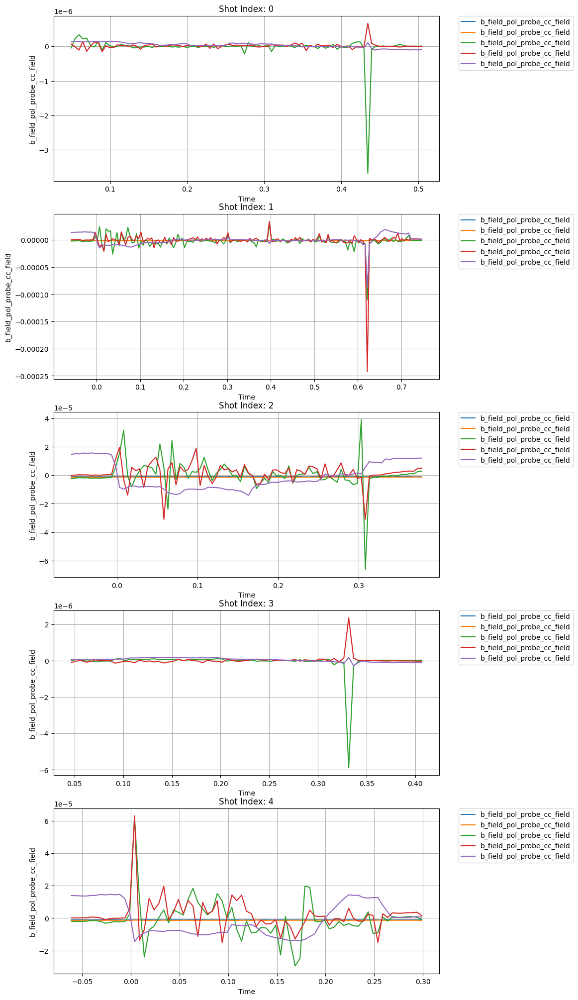

In [423]:
var = variables[0]      # b_field_pol_probe_cc_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### B. b_field_pol_probe_ccbv_field

Shape of the variable (533, 40)
Number of NaN values in the variable: [  0 323   0   0   0   0   0   0   0 210   0   0 115   0   0   0   0   0
   0   0 323 210   0   0   0   0   0   0   0   0   0 323   0   0 323   0
   0   0   0   0]


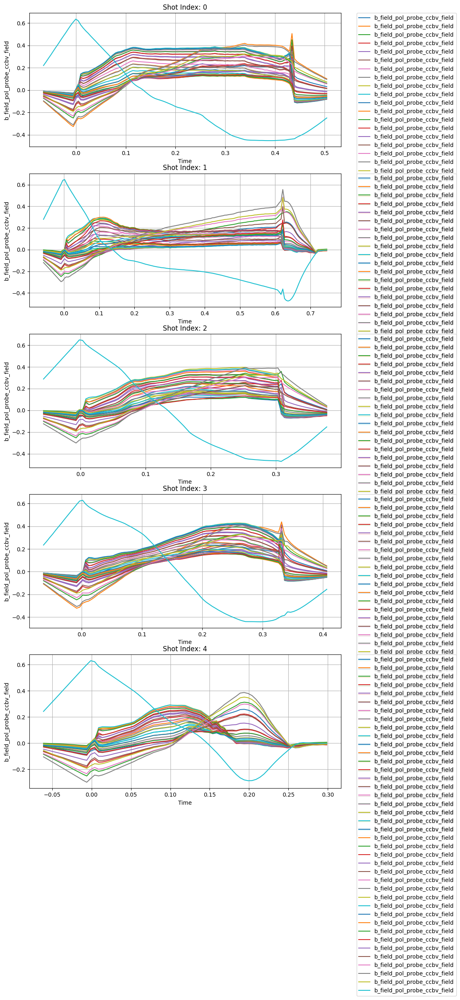

In [424]:
var = variables[1]      # b_field_pol_probe_ccbv_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### C. b_field_pol_probe_obr_field

Shape of the variable (533, 18)
Number of NaN values in the variable: [  0 323 323   0   0   0 323   0   0   0 323   0   0   0   0   0   0   0]


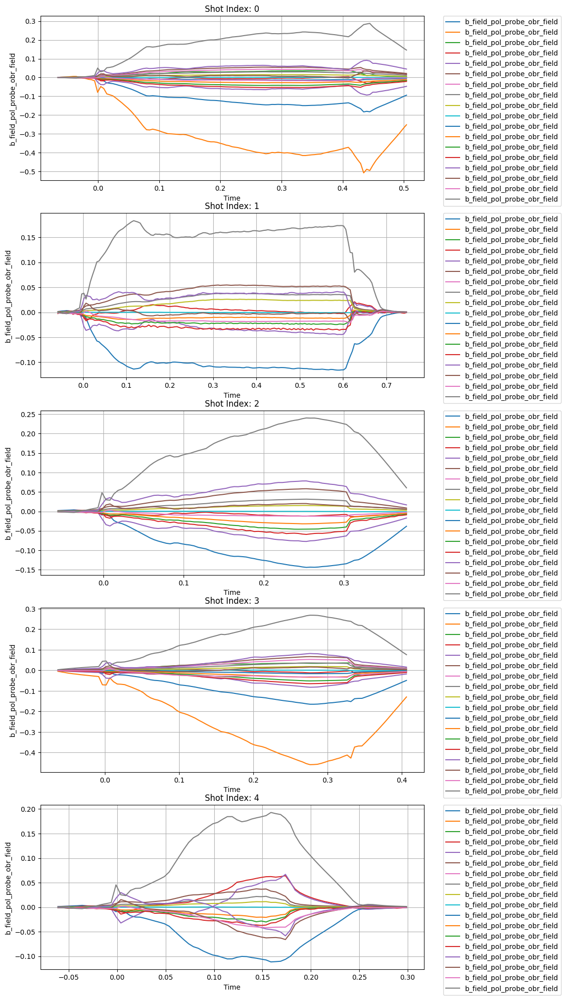

In [425]:
var = variables[2]      # b_field_pol_probe_obr_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### D. b_field_pol_probe_obv_field

Shape of the variable (533, 18)
Number of NaN values in the variable: [323 323   0   0   0   0 323 323   0 533   0 323 323 323 323 323   0   0]


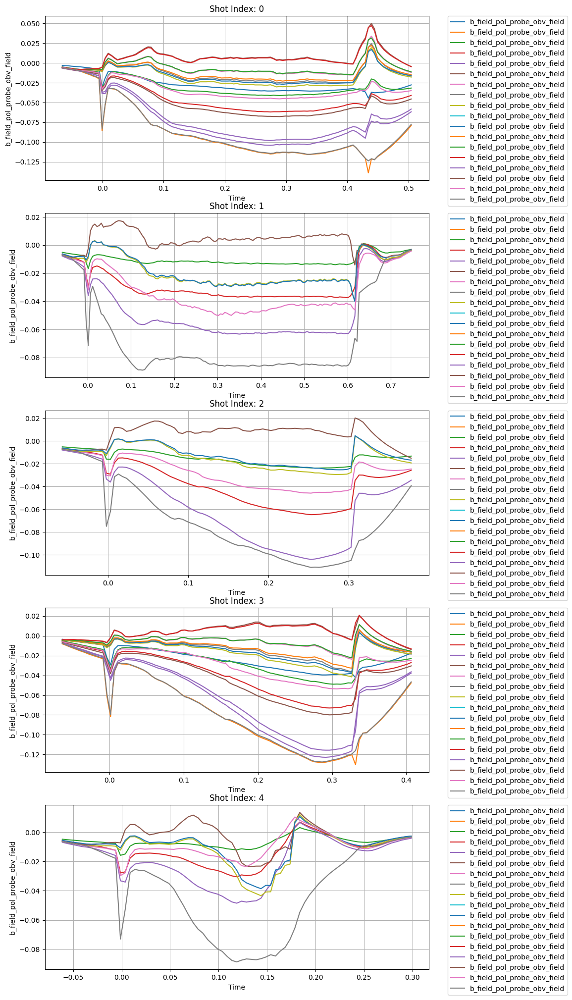

In [426]:
var = variables[3]      # b_field_pol_probe_obv_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### E. b_field_pol_probe_omv_voltage

Shape of the variable (533, 3)
Number of NaN values in the variable: [33 33 33]


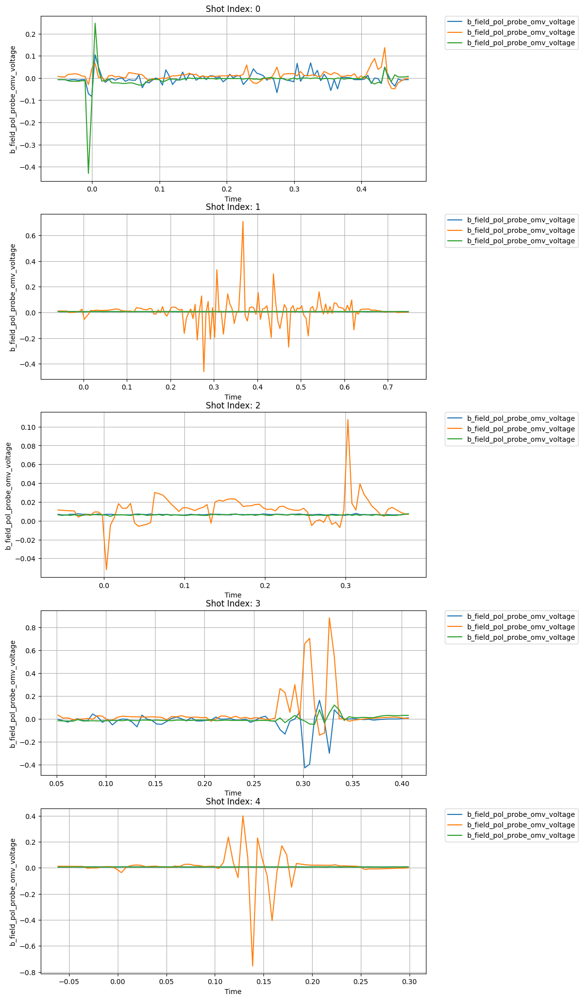

In [427]:
var = variables[4]      # b_field_pol_probe_omv_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### F. b_field_tor_probe_saddle_field

Shape of the variable (533, 12)
Number of NaN values in the variable: [161 161 161 161 161 161 161 161 533 533 533 533]


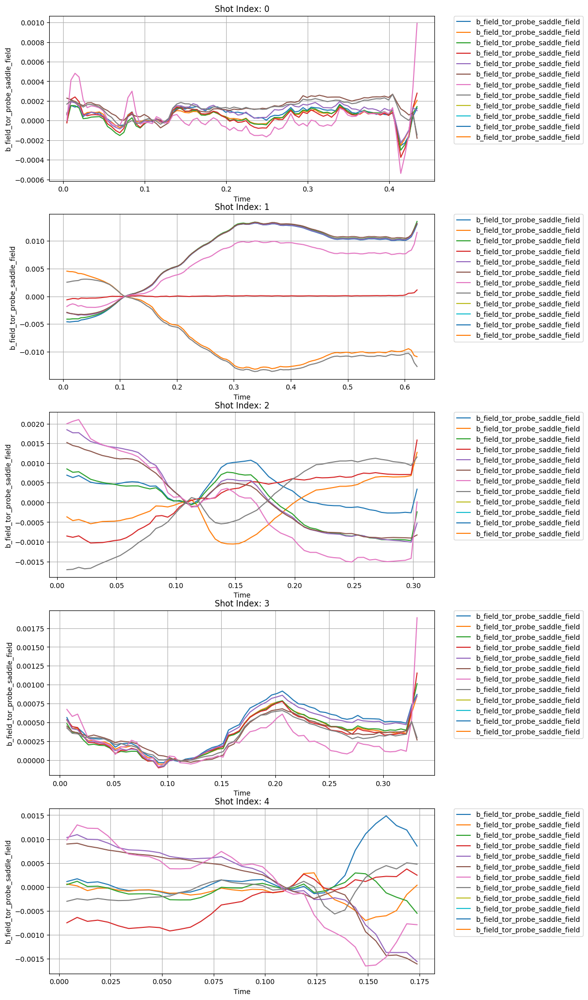

In [428]:
var = variables[5]      # b_field_tor_probe_saddle_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### G. b_field_tor_probe_saddle_voltage

Shape of the variable (533, 12)
Number of NaN values in the variable: [  0   0   0   0   0   0   0   0   0 210 210 210]


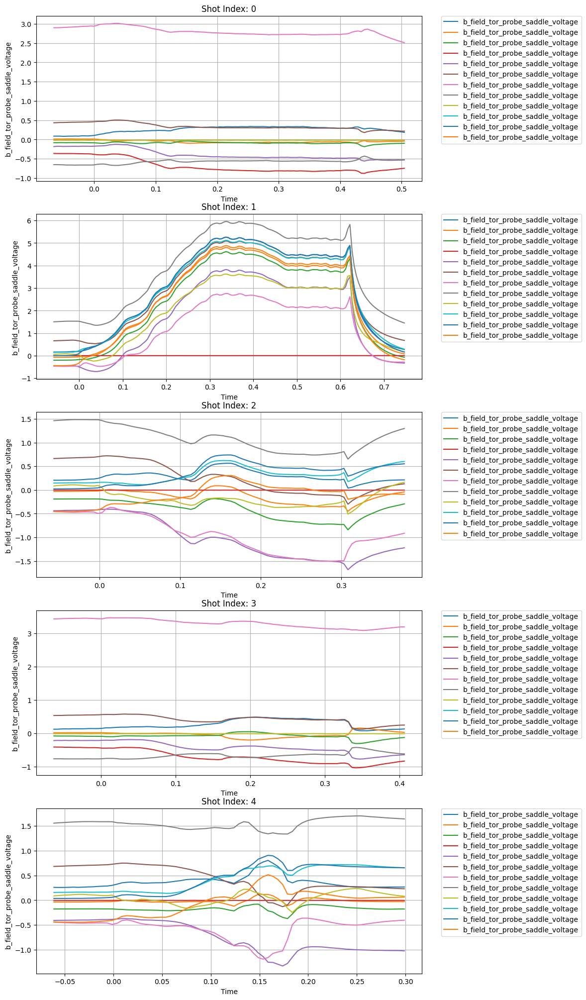

In [429]:
var = variables[6]      # b_field_tor_probe_saddle_voltage
visualize_data_1D(train, var, visu="shots", shot_index=None)

### H. flux_loop_flux

Shape of the variable (533, 15)
Number of NaN values in the variable: [  0   0   0   0   0   0   0   0   0   0   0   0   0   0 210]


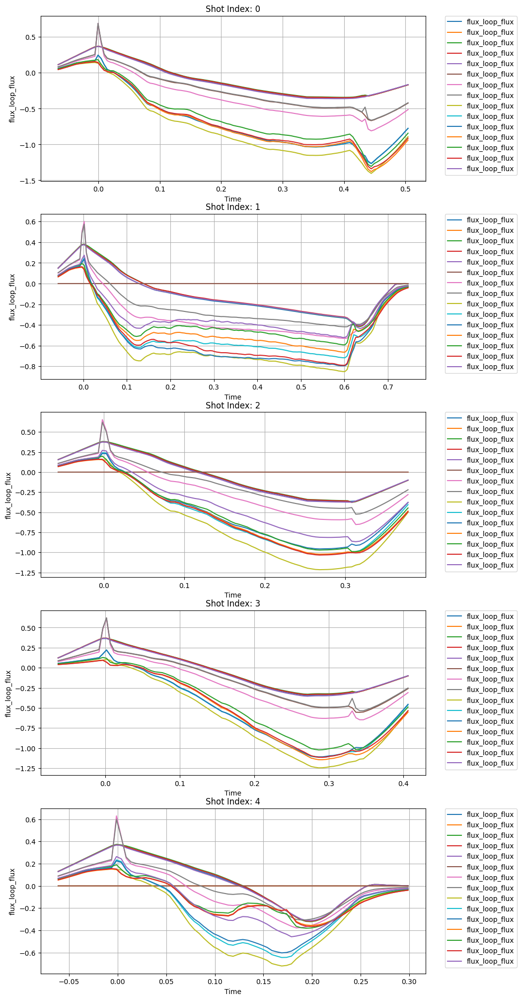

In [430]:
var = variables[7]      # flux_loop_flux 
visualize_data_1D(train, var, visu="shots", shot_index=None)

### I. ip

Shape of the variable (533,)
Number of NaN values in the variable: 0


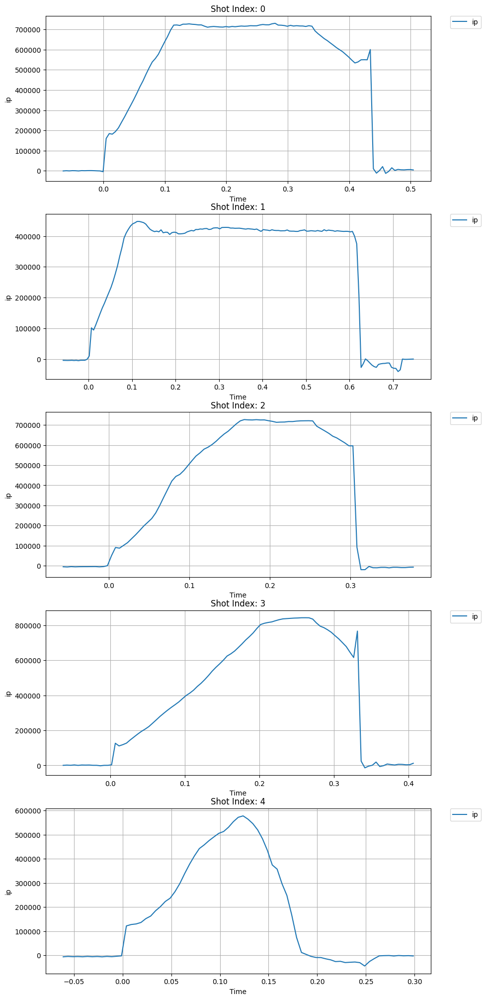

In [431]:
var = variables[8]      # ip
visualize_data_1D(train, var, visu="shots", shot_index=None)

### J. density_gradient

Shape of the variable (533,)
Number of NaN values in the variable: 58


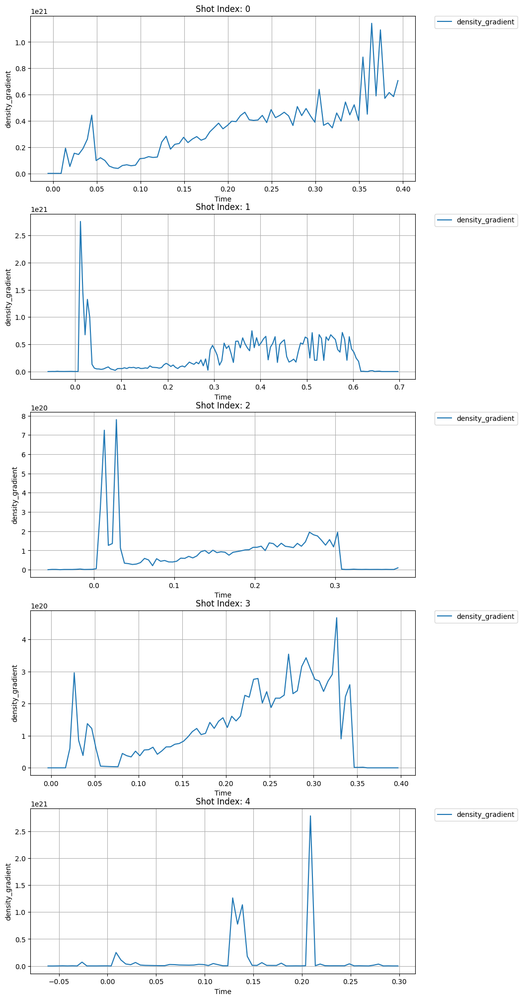

In [432]:
var = variables[9]      # density_gradient 
visualize_data_1D(train, var, visu="shots", shot_index=None)

### K. filter_spectrometer_dalpha_voltage

Shape of the variable (533, 3)
Number of NaN values in the variable: [59 59 59]


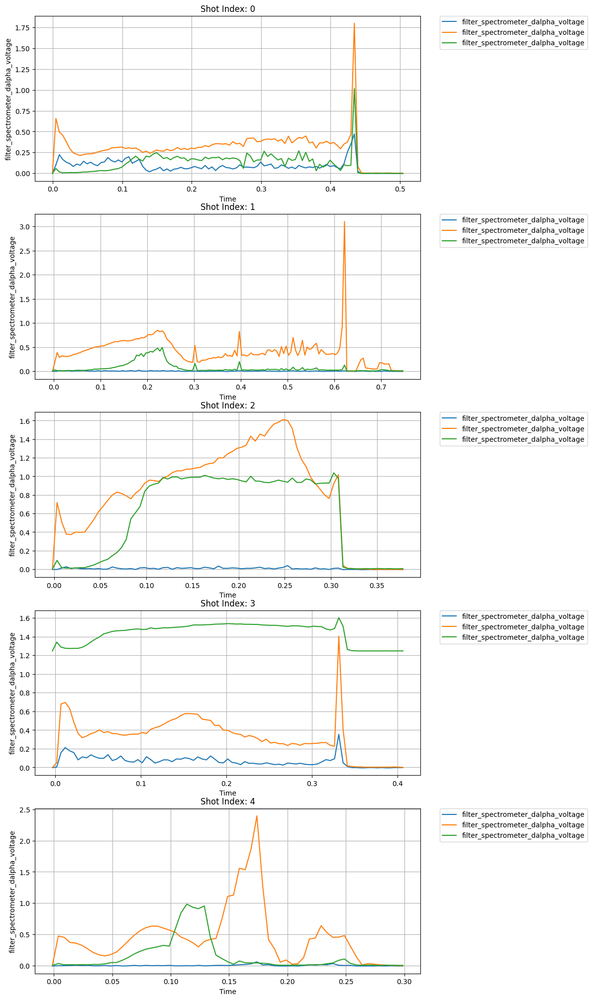

In [433]:
var = variables[10]      # filter_spectrometer_dalpha_voltage
visualize_data_1D(train, var, visu="shots", shot_index=None)

### L. horizontal_cam_lower

Shape of the variable (533, 18)
Number of NaN values in the variable: [91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91]


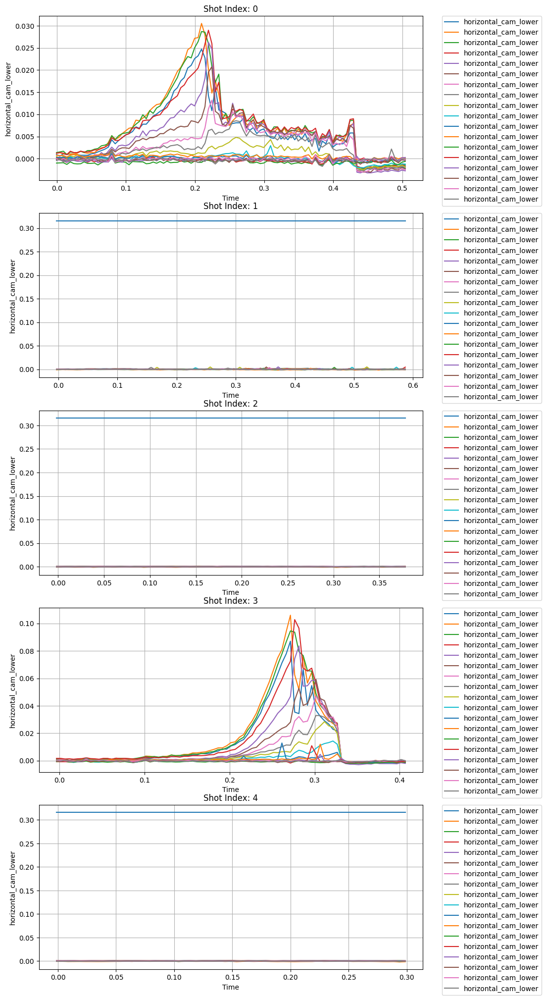

In [434]:
var = variables[11]      # horizontal_cam_lower
visualize_data_1D(train, var, visu="shots", shot_index=None)

### M. horizontal_cam_upper

Shape of the variable (533, 18)
Number of NaN values in the variable: [91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91 91]


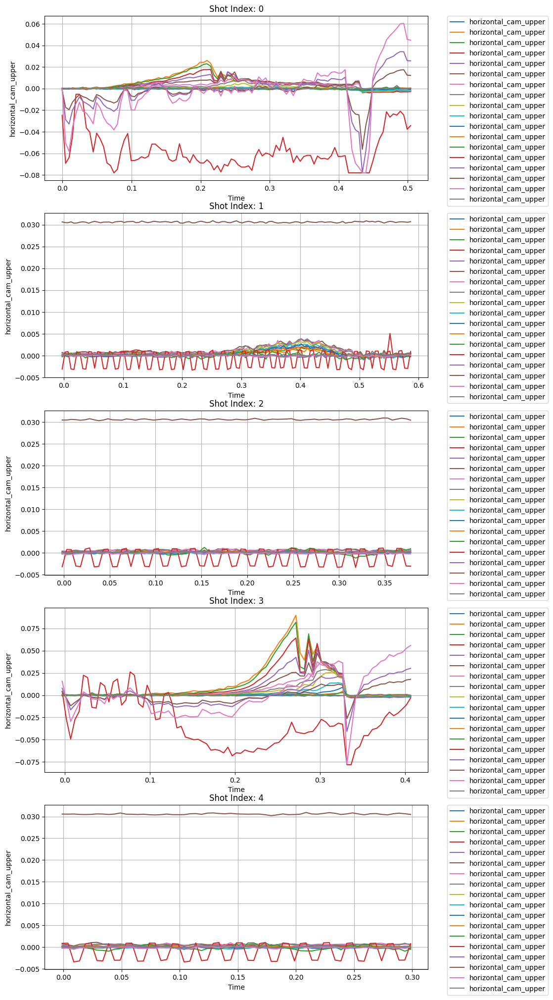

In [435]:
var = variables[12]      # horizontal_cam_upper
visualize_data_1D(train, var, visu="shots", shot_index=None)

### N. n_e

Shape of the variable (533, 65)
Number of NaN values in the variable: [533 533 533 533 533 533 533 533 387 362 439 364 342 328 182 181 181 191
 186 187 190 185 188 190 189 191 194 194 200 205 213 208 215 229 230 249
 251 252 265 278 283 289 289 285 310 337 380 475 533 533 533 533 533 533
 533 533 533 533 533 533 533 533 533 533 533]


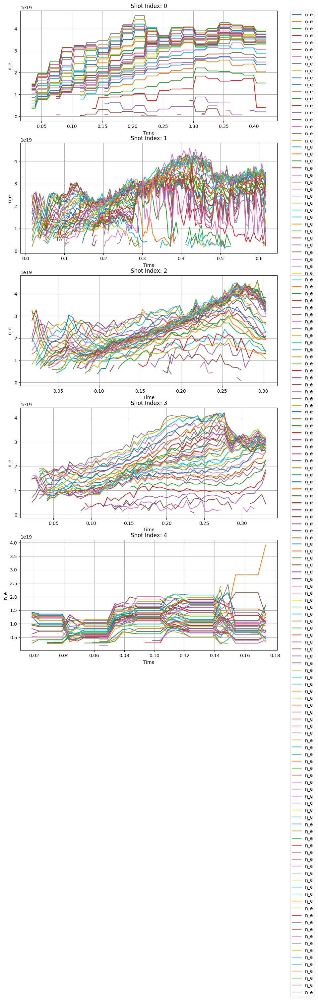

In [436]:
var = variables[13]      # n_e
visualize_data_1D(train, var, visu="shots", shot_index=None)

### O. n_e_core

Shape of the variable (533,)
Number of NaN values in the variable: 179


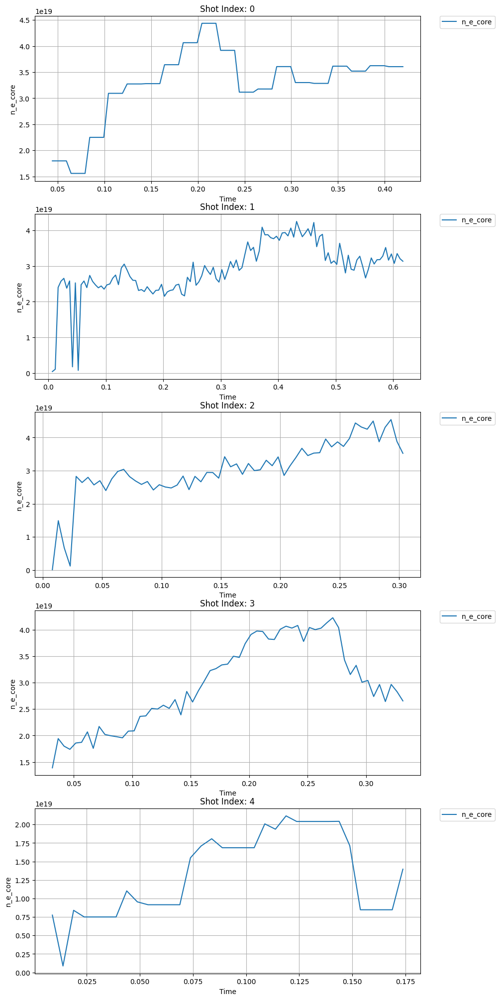

In [437]:
var = variables[14]      # n_e_core
visualize_data_1D(train, var, visu="shots", shot_index=None)

### P. p_e

Shape of the variable (533, 65)
Number of NaN values in the variable: [533 533 533 533 533 533 533 533 387 362 439 364 342 328 182 181 181 191
 186 187 190 185 188 190 189 191 194 194 200 205 213 208 215 229 230 249
 251 252 265 278 283 289 289 285 310 337 380 475 533 533 533 533 533 533
 533 533 533 533 533 533 533 533 533 533 533]


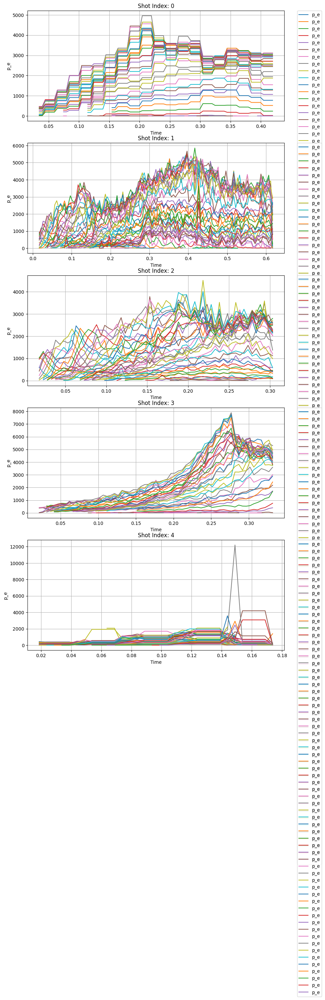

In [438]:
var = variables[15]      # p_e
visualize_data_1D(train, var, visu="shots", shot_index=None)

### Q. t_e

Shape of the variable (533, 65)
Number of NaN values in the variable: [533 533 533 533 533 533 533 533 387 362 439 364 342 328 182 181 181 191
 186 187 190 185 188 190 189 191 194 194 200 205 213 208 215 229 230 249
 251 252 265 278 283 289 289 285 310 337 380 475 533 533 533 533 533 533
 533 533 533 533 533 533 533 533 533 533 533]


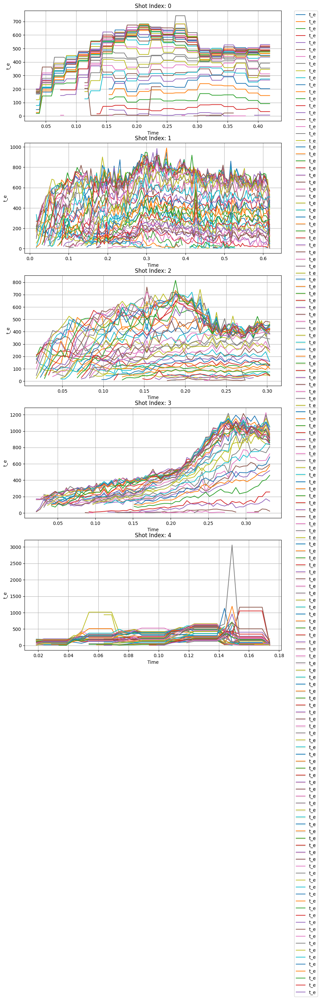

In [439]:
var = variables[16]      # t_e
visualize_data_1D(train, var, visu="shots", shot_index=None)

### R. t_e_core

Shape of the variable (533,)
Number of NaN values in the variable: 179


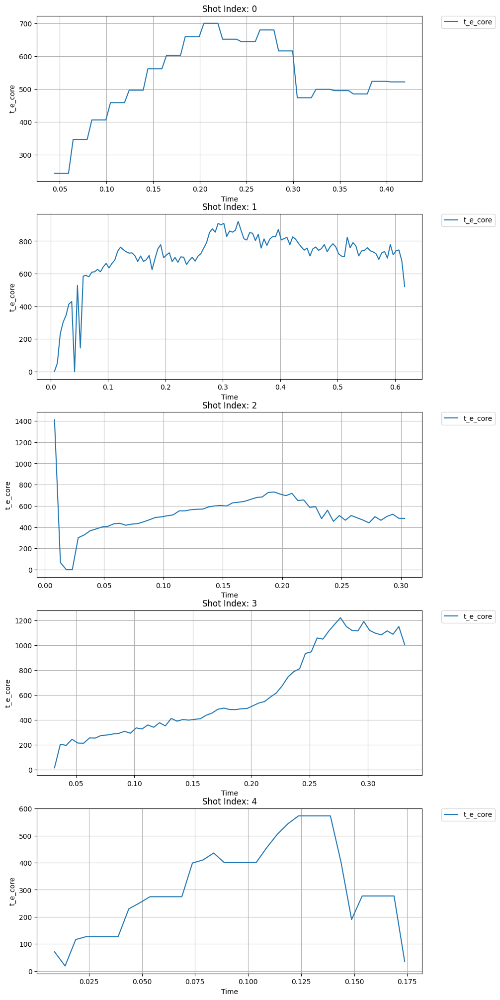

In [440]:
var = variables[17]      # t_e_core
visualize_data_1D(train, var, visu="shots", shot_index=None)

### S. shot_index

Shape of the variable (533,)
Number of NaN values in the variable: 0


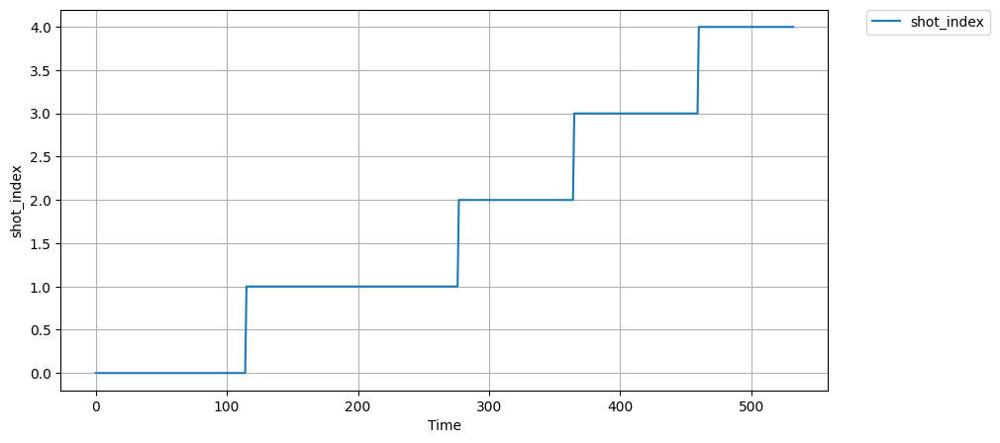

In [441]:
var = variables[18]      # shot_index
visualize_data_1D(train, var, visu="all", shot_index=None)

### T. psi

Shape of the variable (533, 65, 65)
Number of NaN values in the variable: [[129 129 129 ... 129 129 129]
 [129 129 129 ... 129 129 129]
 [129 129 129 ... 129 129 129]
 ...
 [129 129 129 ... 129 129 129]
 [129 129 129 ... 129 129 129]
 [129 129 129 ... 129 129 129]]


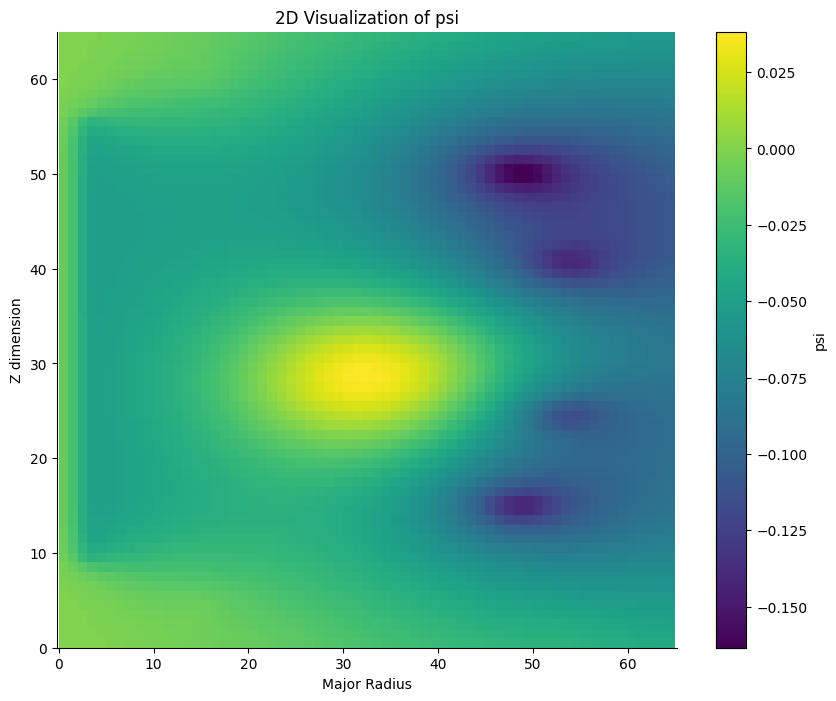

In [442]:
var = variables[19]      # psi
visualize_data_2D(train, var, time_index=240)

### U. b_field_tor_probe_cc_field

Shape of the variable (533, 3)
Number of NaN values in the variable: [210 210 210]


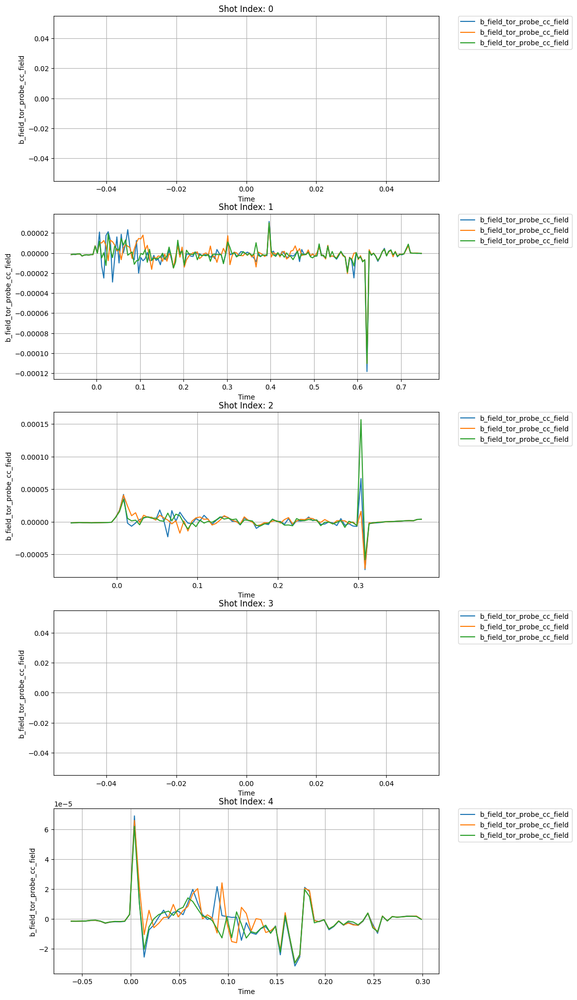

In [443]:
var = variables[20]      # b_field_tor_probe_cc_field
visualize_data_1D(train, var, visu="shots", shot_index=None)

### V. b_field_tor_probe_omaha_voltage

Shape of the variable (533, 4)
Number of NaN values in the variable: [277 277 277 277]


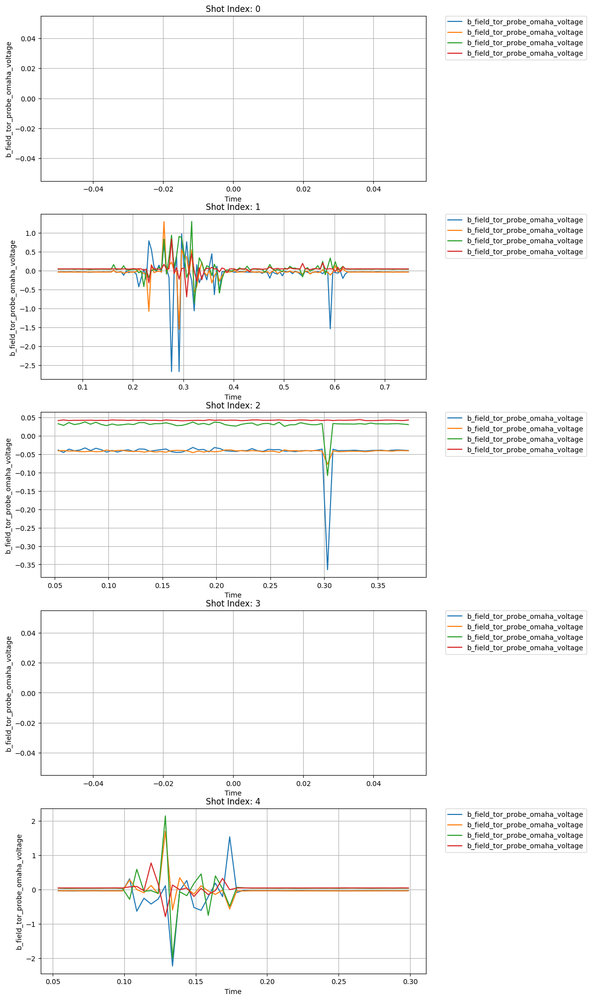

In [444]:
var = variables[21]      # b_field_tor_probe_omaha_voltage
visualize_data_1D(train, var, visu="shots", shot_index=None)

### W. filter_spectrometer_bes_voltage

Shape of the variable (533, 32)
Number of NaN values in the variable: [223 223 223 223 223 223 223 223 223 223 223 223 223 223 223 223 223 223
 223 223 223 223 223 223 223 223 223 223 223 223 223 223]


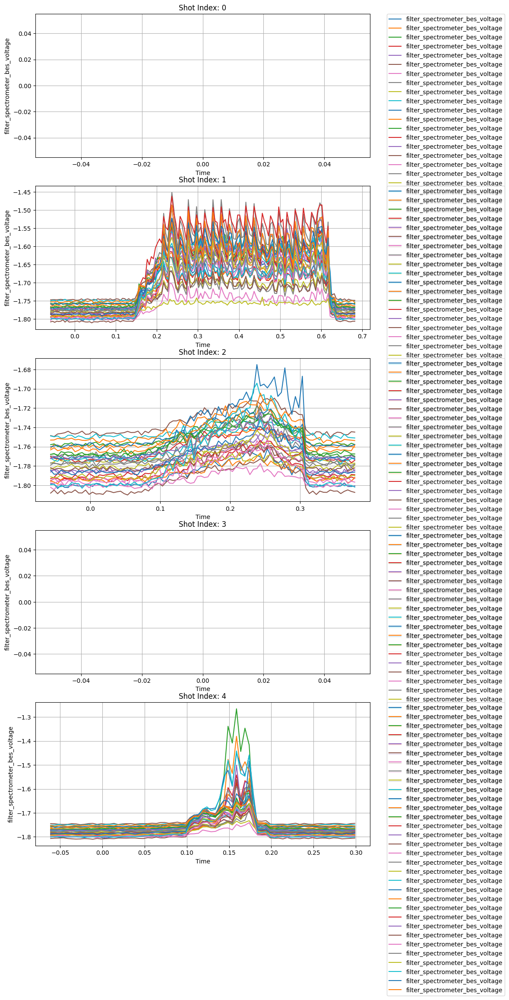

In [445]:
var = variables[22]      # filter_spectrometer_bes_voltage
visualize_data_1D(train, var, visu="shots", shot_index=None)

### X. tangential_cam

Shape of the variable (533, 18)
Number of NaN values in the variable: [276 276 276 276 276 276 276 276 276 276 276 276 276 276 276 276 276 276]


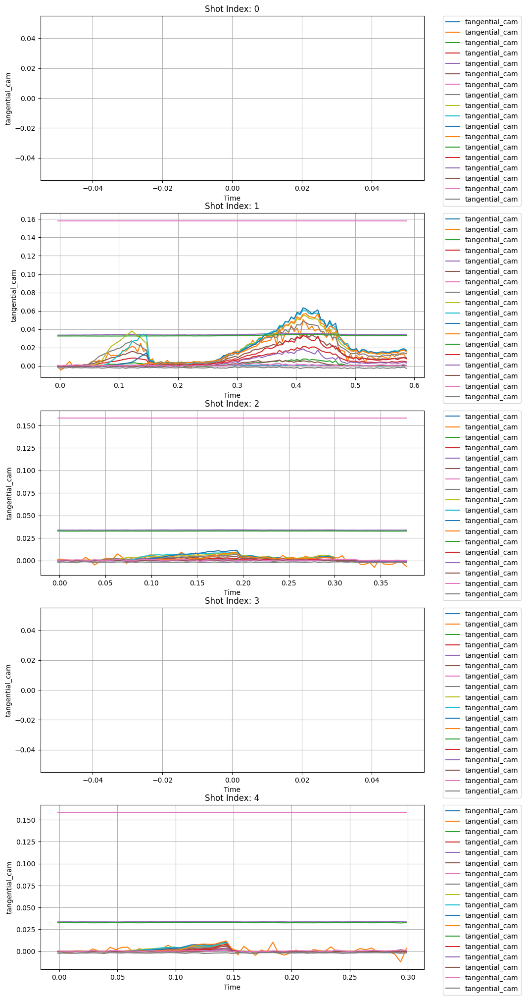

In [446]:
var = variables[23]      # tangential_cam
visualize_data_1D(train, var, visu="shots", shot_index=None)

### 3. What are the effect of `xr.Dataset.dropna()` on the data ?

In [447]:
coordinates = list(train.coords)
print(len(coordinates))
for c in coordinates:
    print(c)

18
b_field_pol_probe_cc_channel
b_field_pol_probe_ccbv_channel
b_field_pol_probe_obr_channel
b_field_pol_probe_obv_channel
b_field_pol_probe_omv_channel
b_field_tor_probe_saddle_field_channel
b_field_tor_probe_saddle_voltage_channel
flux_loop_channel
time
dalpha_channel
horizontal_cam_lower_channel
horizontal_cam_upper_channel
major_radius
z
b_field_tor_probe_cc_channel
b_field_tor_probe_omaha_channel
bes_channel
tangential_cam_channel


#### Example with the flux loop

Shape of the variable (533, 15)
Number of NaN values in the variable: [  0   0   0   0   0   0   0   0   0   0   0   0   0   0 210]


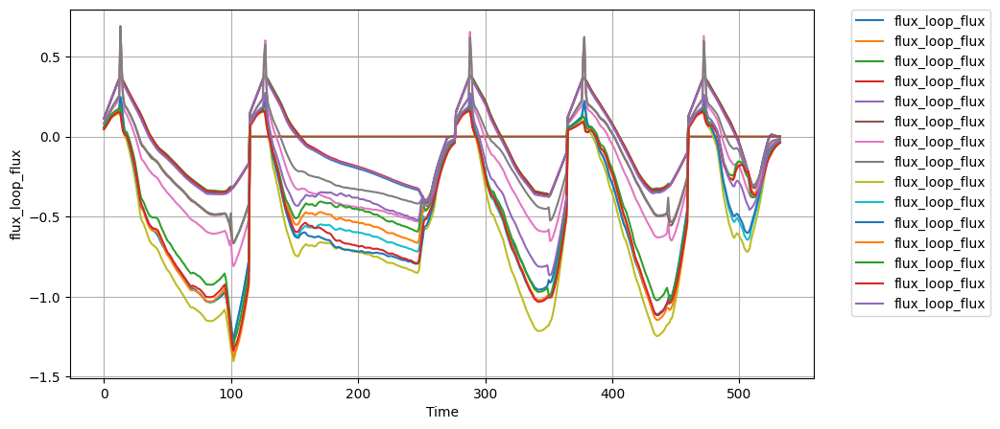

Shape of the variable (533, 14)
Number of NaN values in the variable: [0 0 0 0 0 0 0 0 0 0 0 0 0 0]


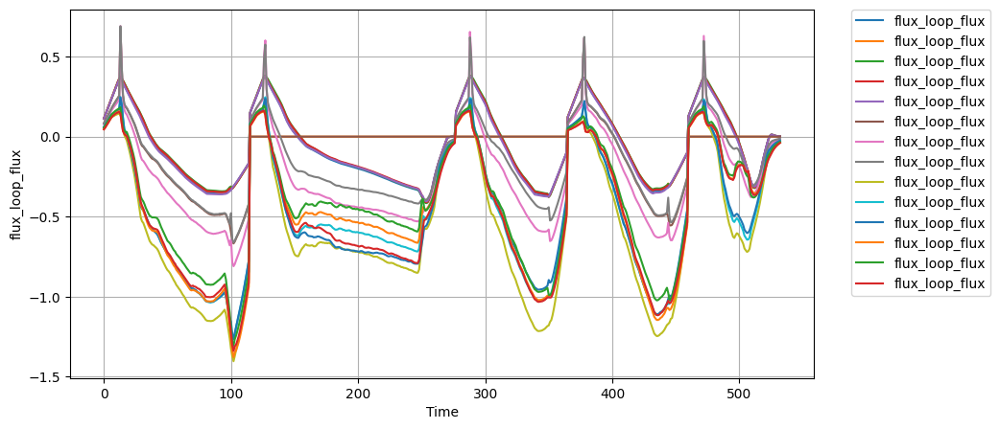

In [448]:

var = variables[7]      # flux_loop_flux
coor = coordinates[7]  # flux_loop_channel


visualize_data_1D(train, var, visu="all", shot_index=None)

train_cleaned = train.dropna(dim=coor)

visualize_data_1D(train_cleaned, var, visu="all", shot_index=None)


#### Test for every other channels

In [464]:
# Find the variable that always contains NaN values

def find_nan_variable(data: xr.Dataset, variable_name: str, shot_index: int = 0) -> None:
    """
    Find and print the number of NaN values in a specific variable for a given shot index.

    Parameters:
    - data: xarray Dataset containing the variable.
    - variable_name: Name of the variable to check for NaN values.
    - shot_index: Index of the shot to check for NaN values.
    Returns:
    - None
    """

    print("====================================")
    print("Variable name:", variable_name)
    index = data.shot_index.values == shot_index
    print("Number of NaN values in the variable:", (data[variable_name].isnull().to_numpy()[index].sum(axis=0)))
    var_coords = list(data[variable_name].coords)
    print("Variable coordinates:", var_coords)
    dims_to_drop = [coord for coord in var_coords if coord != "time" and coord != "shot_index" and coord in data.dims]
    print("Dimensions to drop:", dims_to_drop)
    data2 = data.copy()
    for dim in dims_to_drop:
        data2 = data2.dropna(dim=dim)
    index2 = data2.shot_index.values == shot_index
    print(data2[variable_name].shape)
    print("Number of NaN values after dropping:", (data2[variable_name].isnull().to_numpy()[index2].sum(axis=0)))
    


var = variables[0]  # flux_loop_flux
find_nan_variable(train, var, shot_index=1)

Variable name: b_field_pol_probe_cc_field
Number of NaN values in the variable: [0 0 0 0 0]
Variable coordinates: ['b_field_pol_probe_cc_channel', 'time']
Dimensions to drop: ['b_field_pol_probe_cc_channel']
(533, 0)
Number of NaN values after dropping: []


In [465]:
def find_nan_variable(data: xr.Dataset, variable_name: str, shot_index: int = 0) -> None:
    """
    Analyse les valeurs NaN d'une variable pour un shot donné, en conservant les dimensions pertinentes.
    
    Parameters:
    - data: Dataset xarray
    - variable_name: Nom de la variable à analyser
    - shot_index: Index du shot à examiner
    """
    print("====================================")
    print("Variable name:", variable_name)
    
    # Sélection du shot spécifique
    var_data = data[variable_name].sel(shot_index=shot_index)
    print("Shape initial:", var_data.shape)
    
    # Compte des NaN par dimension
    print("\nNaN par dimension:")
    for dim in var_data.dims:
        print(f"- {dim}: {var_data.isnull().sum(dim=dim).values}")
    
    # Identification des dimensions à conserver
    keep_dims = [dim for dim in var_data.dims if dim not in ['shot_index']]
    print("\nDimensions à conserver:", keep_dims)
    
    # Suppression des NaN tout en conservant la structure
    cleaned_data = var_data.dropna(dim=keep_dims[0], how='all')
    print("\nAprès dropna:")
    print("Shape:", cleaned_data.shape)
    print("NaN restants:", cleaned_data.isnull().sum().item())

var = variables[0]  # flux_loop_flux
find_nan_variable(train, var, shot_index=1)

Variable name: b_field_pol_probe_cc_field


KeyError: "'shot_index' is not a valid dimension or coordinate for Dataset with dimensions FrozenMappingWarningOnValuesAccess({'b_field_pol_probe_cc_channel': 5, 'time': 533})"

In [455]:
train2 = train.copy()
for channel in coordinates:


SyntaxError: incomplete input (98316202.py, line 2)